In a previous notebook https://github.com/AllenInstitute/aisynphys/blob/master/doc/connectivity_vs_distance.ipynb, we explored the distance dependenc on connectivity and how it can be modeled such that we can reliably compare connection probability among cells of different types probed at different distances. Here we extend that analysis to a number of other features in our dataset that are known to contribute to our ability to estimate the true, in vivo, connection probability. These factors fall into two main categories, those related to affects on neuronal processes due to the slicing procedure and our ability to detect small connections in noisy electrophysiological recordings.

Multipatch slice electrophysiology is one of the best methods for indepth characterization of synaptic connections. However, a consistent criticism  of slice physgiology is that measured connection probability (Cp) is a lower bounds of the true Cp due to severing of processes during slicing. We took multiple steps to reduce this liklihood in our dataset including the use of relatively thick slices (350um), targeting cells deep into the slice (at least 40um) and close together (typically 100um). We have additional measurements of axon and apical dendrite length before truncation from biocytin fills of recorded cells which we may use to estimage the affect on connection probability. 

It is also the case that electrophysiological recordings contain some amount of baseline noise. The level of this can be cell type dependent and may obscure very small responses unless we can average many many responses together, which is ultimately related to how long we record from the cells.

This notebook will explore these data and the impact it might have on Cp.

First let's import a bunch of stuff we might need including the database which holds all of our data

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns
from scipy import stats
from collections import OrderedDict
from aisynphys.database import SynphysDatabase
from aisynphys.cell_class import CellClass, classify_cells, classify_pairs
from aisynphys.connectivity import connectivity_profile, GaussianModel, MouseConnectivityModel, adjust_cp, connection_probability_ci
from aisynphys.ui.notebook import show_connectivity_profile, show_distance_binned_cp, show_connectivity_raster, show_connectivity_fit, set_distance_xticks, show_connectivity_matrix, compose_svg_figure
import warnings; warnings.simplefilter('ignore')

db = SynphysDatabase.load_current('medium')
print(db.schema_version)

21


In [2]:
# plotting functions and formatting

def plot_metric_profile(probed, conn, ax, metric_opts, model_opts, color=(0.5, 0, 0)):
    # plot step histogram with confidence intervals
    ymax = metric_opts['ymax']
    tickheight = ymax / 10
    offset = 2
    x_bins = metric_opts['xbins']
    x_vals = np.linspace(x_bins[0], x_bins[-1], 200)
    
    _, cprop, lower, upper = connectivity_profile(conn, probed, x_bins)
    show_distance_binned_cp(x_bins, cprop, ax, ci_lower=lower, ci_upper=upper)
    
    alpha = metric_opts['alpha']
    ax.eventplot(probed.copy(), lineoffsets=-tickheight*offset, linelengths=tickheight, color=((0, 0, 0) + (alpha[0],)))
    ax.eventplot(probed[conn], lineoffsets=-tickheight*(offset-1), linelengths=tickheight, color=((0, 0, 0) + (alpha[1],)))
    ax.axhline(0, color=(0, 0, 0))
    
    interval = x_bins[1] - x_bins[0]
    xticks = np.arange(0, x_vals.max(), interval)
    ax.set_xticks(xticks)
    tick_labels = ['%0.1f'%(x*metric_opts['scale']) for x in xticks]
    trailing_zero = [label.strip('.')[-1] == '0' for label in tick_labels]
    if all(trailing_zero):
        tick_labels = ['%0.0f'%(x*metric_opts['scale']) for x in xticks] 
    if 'axon' in metric:
        ind_200 = [i for i, tl in enumerate(tick_labels) if tl =='200'][0]
        tick_labels[ind_200] = ' >=200'
    ax.set_xticklabels(tick_labels, fontsize=8)
    ax.set_xlim(x_bins[0], x_bins[-1])
    
    y_vals = np.arange(0, ymax + 0.1, 0.1)
    ax.set_yticks([-tickheight*2, -tickheight] + list(y_vals))
    ax.set_yticklabels(['probed', 'connected'] + ['%0.1f'%x for x in y_vals], fontsize=8)
    ax.set_ylim(-tickheight*2.6, ymax)
    x_label = "%s (%s)" % (metric_opts['label'], metric_opts['units'])
    ax.set_xlabel(x_label, fontsize=8)
    
    # fit metric model and plot
    model = model_opts['model']
    model_opts = model_opts['model_opts']
    fit = model.fit(probed, conn, **model_opts)
    ax.plot(x_vals, fit.connection_probability(x_vals), color=color, lw=2)
    ax.axhline(fit.pmax, color=color, ls='--')
    
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)


def metric_hist(metric_data, ax, opts={}):
    ax.hist(metric_data, color=(0.8, 0.8, 0.8))
    
    x_bins = opts['xbins']
    x_vals = np.linspace(x_bins[0], x_bins[-1], 200)
    
    interval = x_bins[1] - x_bins[0]
    xticks = np.arange(0, x_vals.max(), interval)
    ax.set_xticks(xticks)
    tick_labels = ['%0.1f'%(x*metric_opts['scale']) for x in xticks]
    trailing_zero = [label.strip('.')[-1] == '0' for label in tick_labels]
    if all(trailing_zero):
        tick_labels = ['%0.0f'%(x*metric_opts['scale']) for x in xticks] 
    if 'axon' in metric:
        ind_200 = [i for i, tl in enumerate(tick_labels) if tl =='200'][0]
        tick_labels[ind_200] = ' >=200'
    ax.set_xticklabels(tick_labels, fontsize=8)
    ax.set_xlim(x_bins[0], x_bins[-1])
    
    x_label = "%s (%s)" % (opts['label'], opts['units'])
    ax.set_xlabel(x_label, fontsize=8)
    ax.set_ylabel('N pairs', fontsize=8)
    ax.spines['right'].set_visible(False)
    ax.spines['top'].set_visible(False)
    
adjustment_metric_plot_opts = {
    'lateral_distance':{
        'ymax': 0.4,
        'xbins': np.arange(0, 400e-6, 60e-6),
        'alpha':[0.01, 0.1],
        'units': 'µm', 
         'scale': 1e6,
        'label': 'Lateral Distance',
        },
    'pre_axon_length': 
        {'ymax': 0.2, 
         'xbins': np.arange(0, 280e-6, 40e-6), 
         'alpha':[0.03, 0.3],
         'label': 'Pre-syn axon length', 
         'units': 'µm', 
         'scale': 1e6,
        },
    'avg_pair_depth': 
        {'ymax': 0.2, 
         'xbins': np.arange(0, 200e-6, 30e-6), 
         'alpha': [0.01, 0.1], 
         'label': 'Avg pair depth', 
         'units': 'µm', 
         'scale': 1e6,
        },
    'detection_power': 
        {'ymax': 0.3, 
         'xbins': np.arange(3.4, 5.21, 0.2), 
         'alpha': [0.01, 0.1], 
         'units': 'a.u.', 
         'scale': 1, 
         'label': 'Log10 detection power',
        }
}

In [3]:
# select all excitatory / inhibitory pairs
projects = ['mouse V1 coarse matrix', 'mouse V1 pre-production']
mouse_pairs = db.pair_query(project_name=projects).all()
print("loaded %d cell pairs" % len(mouse_pairs))

loaded 83006 cell pairs


In [4]:
mouse_conn_model = MouseConnectivityModel(db=db)
mouse_conn_model.build_ei_model(mouse_pairs)
ei_connectivity = mouse_conn_model.connectivity_model

In [5]:
filtered_pairs = [p for p in mouse_conn_model.pairs if mouse_conn_model.filter_pair(p, mouse_conn_model.pairs)]

Text(0, 0.5, 'Adjusted Connection Probability')

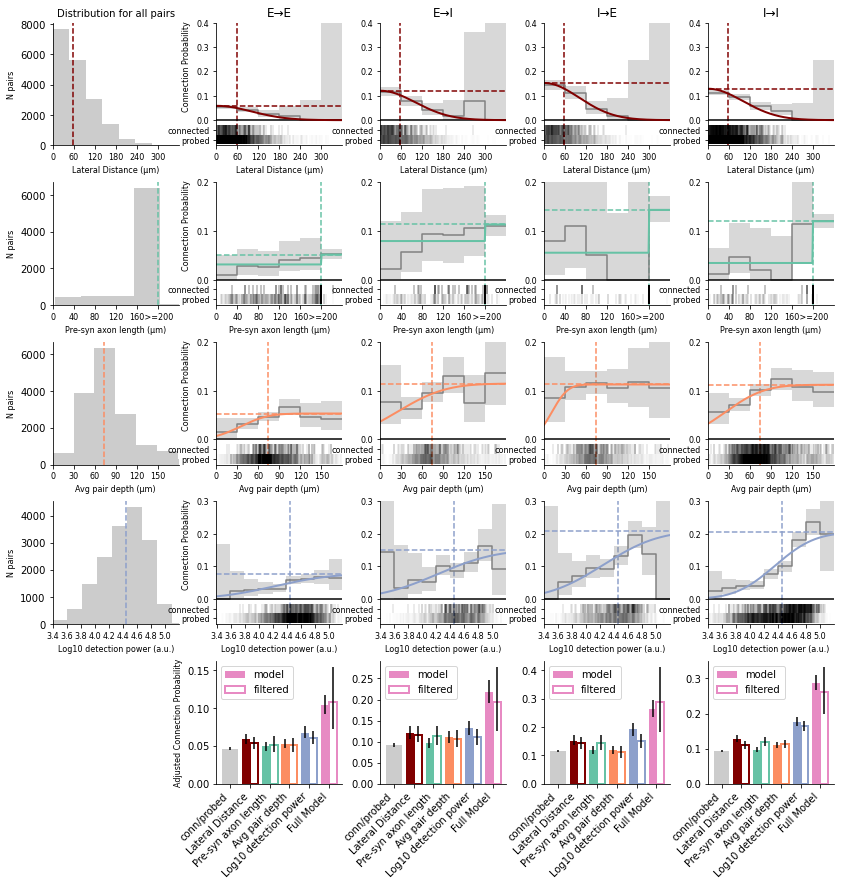

In [6]:
title = {'ex': 'E', 'in': 'I'}
metrics_to_plot = ['lateral_distance', 'pre_axon_length', 'avg_pair_depth', 'detection_power']

fit_results = pd.DataFrame(columns=['ei_class', 'metric', 'fit_type', 'pmax', 'ci_lower', 'ci_upper'])

metric_fig, axs = plt.subplots(len(metrics_to_plot) + 1, 5, figsize=(14,14))
plt.subplots_adjust(hspace=0.3, wspace=0.3)
colors = [(0.5, 0, 0)] + list(sns.color_palette("Set2", n_colors=len(metrics_to_plot) + 0))
for i, (ei_class, results) in enumerate(ei_connectivity.items()):
    axs[0, i+1].set_title("%s→%s" % (title[ei_class[0]], title[ei_class[1]]), fontsize=12)
    pairs = results['probed_pairs']
    conn = np.array([p.has_synapse for p in pairs], dtype=bool)  
    bar_tick_labels = []
    cp, ci_lower, ci_upper = results['connection_probability']
    fit_results = fit_results.append({
        'ei_class': ei_class,
        'metric': 'None',
        'fit_type': 'None',
        'pmax': cp,
        'ci_lower': ci_lower,
        'ci_upper': ci_upper
        }, ignore_index=True)
    axs[-1, i+1].bar([0], [cp], yerr=[[cp - ci_lower], [ci_upper - cp]], color=(0.8, 0.8, 0.8))
    bar_tick_labels.append('conn/probed')

    corr_models = results['corr_models']
    
    for j, metric in enumerate(metrics_to_plot):
    
        color = colors[j]
        metric_opts = adjustment_metric_plot_opts[metric]
        metric_data = np.array([getattr(p, metric) for p in mouse_conn_model.pairs], dtype=float)
        metric_mask = np.isfinite(metric_data)
        metric_data = metric_data[metric_mask]
        metric_thresh = np.nanquantile(metric_data, 0.5)
        if i==0:
            metric_hist(metric_data, axs[j, 0], opts=metric_opts)
            axs[j, 0].axvline(metric_thresh, ls='--', color=color)
                              
        probed = np.array([getattr(p, metric) for p in pairs], dtype=float)
        mask = np.isfinite(probed) & np.isfinite(conn)   
        
        axs[j, i+1].axvline(metric_thresh, ls='--', color=color, zorder=-100)
        model_opts = mouse_conn_model.adjustment_metrics[metric]
        plot_metric_profile(probed[mask], conn[mask], axs[j, i+1], metric_opts, model_opts, color=color)
        
        metric_fit = adjust_cp(pairs, corr_models[metric])
        metric_cp, metric_ci_lower, metric_ci_upper = metric_fit.cp_ci
        fit_results = fit_results.append({
            'ei_class': ei_class,
            'metric': metric,
            'fit_type': 'model',
            'pmax': metric_cp,
            'ci_lower': metric_ci_lower,
            'ci_upper': metric_ci_upper
        }, ignore_index=True)
        
        axs[-1, i+1].bar([j+0.8], [metric_cp], yerr=[[metric_cp - metric_ci_lower], [metric_ci_upper - metric_cp]], 
                         color=color, width=0.4) 
        
        if metric == 'lateral_distance':
            filt_metric = [p for p in pairs if getattr(p, metric) is not None and getattr(p, metric) <= metric_thresh]
        else:
            filt_metric = [p for p in pairs if getattr(p, metric) is not None and getattr(p, metric) >= metric_thresh]
        filt_conn = np.array([p.has_synapse for p in filt_metric], dtype=bool)
        filt_cp = sum(filt_conn) / len(filt_metric)
        filt_ci_lower, filt_ci_upper = connection_probability_ci(sum(filt_conn), len(filt_metric))
        fit_results = fit_results.append({
            'ei_class': ei_class,
            'metric': metric,
            'fit_type': 'filter',
            'pmax': filt_cp,
            'ci_lower': filt_ci_lower,
            'ci_upper': filt_ci_upper
        }, ignore_index=True)
        
        axs[-1, i+1].bar(j+1.2, filt_cp, yerr=[[filt_cp - filt_ci_lower], [filt_ci_upper - filt_cp]], edgecolor=color, 
                         linewidth=2, color='w', width=0.4)
        bar_tick_labels.append(metric_opts['label'])
    
    # full correction
    full_adjust = adjust_cp(pairs, corr_models['full_model'])
    full_cp, full_ci_lower, full_ci_upper = full_adjust.cp_ci
    fit_results = fit_results.append({
        'ei_class': ei_class,
        'metric': 'full',
        'fit_type': 'model',
        'pmax': full_cp,
        'ci_lower': full_ci_lower,
        'ci_upper': full_ci_upper
    }, ignore_index=True)
    
    axs[-1, i+1].bar([len(metrics_to_plot)+0.8], [full_cp], yerr=[[full_cp - full_ci_lower], [full_ci_upper - full_cp]], 
                     color=colors[-1], width=0.4, label='model')
    
    # full filter
    full_filt_pairs = [p for p in pairs if p in filtered_pairs]
    full_filt_conn = np.array([p.has_synapse for p in full_filt_pairs], dtype=bool)
    full_filt_cp = sum(full_filt_conn) / len(full_filt_pairs)
    ff_ci_lower, ff_ci_upper = connection_probability_ci(sum(full_filt_conn), len(full_filt_pairs))
    fit_results.append({
        'ei_class': ei_class,
        'metric': 'full',
        'fit_type': 'filter',
        'pmax': full_filt_cp,
        'ci_lower': ff_ci_lower,
        'ci_upper': ff_ci_upper
    }, ignore_index=True)
    
    axs[-1, i+1].bar(len(metrics_to_plot)+1.2, sum(full_filt_conn) / len(full_filt_pairs), yerr=[[full_filt_cp - ff_ci_lower], [ff_ci_upper - full_filt_cp]],
                     edgecolor=colors[-1], linewidth=2, color='w', width=0.4, label='filtered')
    axs[-1, i+1].legend(loc='upper left')
    
    bar_tick_labels.append('Full Model')
    axs[-1, i+1].set_xticks(range(0, len(bar_tick_labels)))
    axs[-1, i+1].set_xticklabels(bar_tick_labels, rotation=45, ha='right')
#     axs[-1, i+1].set_yscale('log')
#     axs[-1, i+1].set_ylim(0, 0.5)
    
    axs[-1, i+1].spines['right'].set_visible(False)
    axs[-1, i+1].spines['top'].set_visible(False)
        
axs[-1, 0].axis("off")
axs[0, 0].set_title('Distribution for all pairs', fontsize=10)
[axs[a, 1].set_ylabel('Connection Probability', fontsize=8) for a in range(0, len(metrics_to_plot))]
[axs[a, 1].yaxis.set_label_coords(-0.2, 0.65) for a in range(0, len(metrics_to_plot))]
axs[-1, 1].set_ylabel('Adjusted Connection Probability', fontsize=8)

In [7]:
# define matrix cell classes

cell_class_criteria = {
    'l23pyr': {'dendrite_type': 'spiny',       'cortical_layer': '2/3'},
    'l23pv':  {'cre_type': 'pvalb',            'cortical_layer': '2/3'},
    'l23sst': {'cre_type': 'sst',              'cortical_layer': '2/3'},
    'l23vip': {'cre_type': 'vip',              'cortical_layer': '2/3'},
    'l4pyr':  {'cre_type': ('nr5a1', 'rorb'),  'cortical_layer': '4'},
    'l4pv':   {'cre_type': 'pvalb',            'cortical_layer': '4'},
    'l4sst':  {'cre_type': 'sst',              'cortical_layer': '4'},
    'l4vip':  {'cre_type': 'vip',              'cortical_layer': '4'},
    'l5et':   {'cre_type': ('sim1', 'fam84b'), 'cortical_layer': '5'},
    'l5it':   {'cre_type': 'tlx3',             'cortical_layer': '5'}, 
    'l5pv':   {'cre_type': 'pvalb',            'cortical_layer': '5'},
    'l5sst':  {'cre_type': 'sst',              'cortical_layer': '5'},
    'l5vip':  {'cre_type': 'vip',              'cortical_layer': '5'},
    'l6pyr':  {'cre_type': 'ntsr1',            'cortical_layer': ('6a','6b')},
    'l6pv':   {'cre_type': 'pvalb',            'cortical_layer': ('6a','6b')},
    'l6sst':  {'cre_type': 'sst',              'cortical_layer': ('6a','6b')},
    'l6vip':  {'cre_type': 'vip',              'cortical_layer': ('6a','6b')},
}
cell_classes = {name:CellClass(name=name, **criteria) for name,criteria in cell_class_criteria.items()}

# define the display labels to use for each cell subclass:
class_labels = {
    'l23pyr': 'L2/3 Pyr\nspiny',
    'l23pv':  'L2/3 Pv',
    'l23sst': 'L2/3 Sst',
    'l23vip': 'L2/3 Vip',
    'l4pyr':  'L4 Pyr\n nr5a1',
    'l4pv':   'L4 Pv',
    'l4sst':  'L4 Sst',
    'l4vip':  'L4 Vip',
    'l5et':   'L5 Pyr ET\nsim1, fam84b',
    'l5it':   'L5 Pyr IT\ntlx3',
    'l5pv':   'L5 Pv',
    'l5sst':  'L5 Sst',
    'l5vip':  'L5 Vip',
    'l6pyr':  'L6 Pyr\nntsr1',
    'l6pv':   'L6 Pv',
    'l6sst':  'L6 Sst',
    'l6vip':  'L6 Vip',
}

cell_groups = classify_cells(cell_classes.values(), pairs=mouse_conn_model.pairs, missing_attr='ignore')

pair_groups = classify_pairs(mouse_conn_model.pairs, cell_groups)

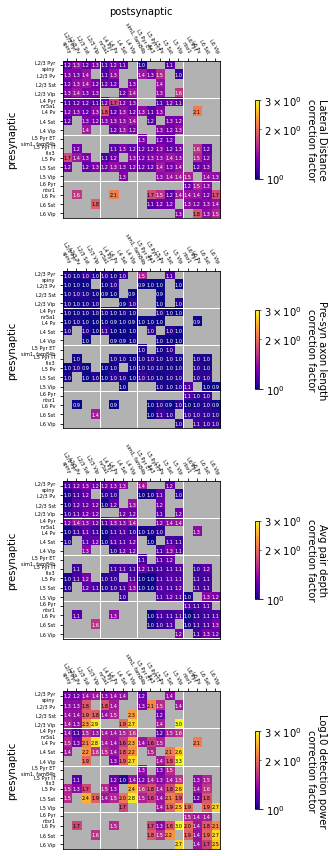

In [8]:
corr_fig, ax = plt.subplots(4, 1, figsize=(10, 12))

for i, metric in enumerate(metrics_to_plot):
    matrix_corr = mouse_conn_model.model_adjust_cp(pair_groups, model=metric) 

    norm = matplotlib.colors.LogNorm(vmin=1.0, vmax=3.0, clip=True)
    cmap = matplotlib.cm.get_cmap('plasma')

    im, cbar, labels = show_connectivity_matrix(
        ax=ax[i], 
        results=matrix_corr, 
        pre_cell_classes=cell_classes.values(), 
        post_cell_classes=cell_classes.values(), 
        class_labels=class_labels, 
        cmap=cmap, 
        norm=norm,
        corrections_applied=True,
        show_pmax=True,
        correction_only=True,
        cbarlabel='', 
    )
    layer_lines=[3.5, 7.5, 12.5]
    [ax[i].axhline(pos, color='white', linewidth=1) for pos in layer_lines]
    [ax[i].axvline(pos, color='white', linewidth=1) for pos in layer_lines]
    metric_opts = adjustment_metric_plot_opts[metric]
    label = metric_opts['label']
    cbar.ax.set_ylabel('%s\ncorrection factor' % label, fontsize=10)
    
    for label in labels:
        split_lines = label.get_text().splitlines()
        if len(split_lines) > 0:
            text = split_lines[1].strip() if len(split_lines) > 1 else ''
            label.set_text(text[:3])
            label.set_fontsize(5)
    ax[i].set_ylabel('presynaptic', fontsize=10)
    if i==0:
        ax[i].set_xlabel('postsynaptic', fontsize=10)
    else:
        ax[i].set_xlabel('')
    
    _ = plt.setp(ax[i].get_xticklabels(), rotation=-60, ha="right", rotation_mode="anchor", fontsize=5)
    _ = plt.setp(ax[i].get_yticklabels(), fontsize=5)

plt.tight_layout()

In [11]:
label_opts = {'size': '16pt', 'font': 'arial', 'weight': 'bold'}
blank_fig, ax = plt.subplots(figsize=(0.1, 0.1))
ax.axis('off')

figure_spec = [
    {'figure': metric_fig, 'pos': (0, 20), 'label': 'A', 'label_opts': label_opts},
    {'figure': blank_fig, 'pos': (0, 190), 'label': 'B', 'label_opts': label_opts},
    {'figure': blank_fig, 'pos': (0, 350), 'label': 'C', 'label_opts': label_opts},
    {'figure': blank_fig, 'pos': (0, 510), 'label': 'D', 'label_opts': label_opts},
    {'figure': blank_fig, 'pos': (140, 690), 'label': 'E', 'label_opts': label_opts},
    {'figure': corr_fig, 'pos': (860, 20), 'label': 'F', 'label_opts': label_opts},
]

compose_svg_figure(figure_spec, size=("14in", "10in"), filename='figure_s02.svg', display=True)